In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import sys,os,time

import numpy as np
import skimage.transform
import skimage.measure
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt

import rasterio

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

import cProfile
import re

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [123]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

def epitome_small(x,K,N,T,NIT,sc):
    return epitome(x,K,N,T,NIT,sc,0,0)

def cum_sum(arr, s):
    cumsum = torch.cumsum(torch.cumsum(arr,dim=2),dim=3)
    m = nn.ConstantPad2d((1,0,1,0),0)
    cumsum = m(cumsum)
    tot = cumsum[:,:,:-s,:-s]-cumsum[:,:,s:,:-s]-cumsum[:,:,:-s,s:]+cumsum[:,:,s:,s:]
    return tot

def to_disp(arr):
    arr_c = arr.cpu().numpy()
    arr_c = np.rollaxis(np.squeeze(arr_c),0,3)
    return arr_c

#learns N x N epitome from T, K x K patches drawn randomly from input image x.
#sc is an optional array of scales to be learnt at, At scale sc[i], T*sc[i]^2 patches are sampled.
#NIT iterations of the E-M algorithm are applied at each scale.
#e,ev = initial epitome mean and variance. If not provided, the mean is initialized
#to the uniform image with some small noise, and the variance is initialized to 1
#p returns an array of probabilities of using each part of the epitome
# the input images should have pixel values between 0 and 1.

def epitome(x,K,N,T,NIT,sc,e,ev):
    #initialize parameters
    xFIN = x
    x = F.max_pool2d(x,int(1/sc[0]))
    
    x = np.clip(x,0,1)
    _, numDim, SY, SX = x.shape #numDim = 10
    TFIN = T
    T = int(np.ceil(TFIN*sc[0]**2))
    NFIN = N
    N = int(np.ceil(sc[0]*NFIN))
    e = torch.zeros((1,numDim,N,N)).to(device)
    ev = torch.ones((1,numDim,N,N)).to(device)
    ev=ev/50;
    for i in range(numDim):
        e[:,i,:,:] = x[0,i,:,:].std()*torch.randn(N,N)/100 + x[0,i,:,:].mean() #e = mean of image plus noise
    p = torch.ones((N,N))/N**2
    onemat = np.ones((K,K))
    MINP = 1e-07
    MINV = 0.01             
    for sci in range(len(sc)):
        if (sci != 0):
            N = int(np.ceil(sc[sci]*NFIN))
            e = F.interpolate(e,[N,N])
            e = torch.clamp(e,min=0,max=1)
            ev = F.interpolate(ev,[N,N])
            ev[ev<MINV] = MINV
            #ev = (ev<MINV)*MINV+(ev>=MINV)*ev
            #p = F.interpolate(p[None,:,:],[N,N],mode='bilinear')
            #p /= torch.sum(p)
            p = torch.ones((N,N))/N**2
            x = F.max_pool2d(xFIN,int(1/sc[sci]))
            x = torch.clamp(x,min=0,max=1)
            T = int(np.ceil(sc[sci]**2*TFIN))
        lP = torch.zeros((N,N),dtype=torch.float).to(device)
        lP0 = torch.ones((N,N),dtype=torch.float).to(device)
        lP0 = torch.log(p)
        lP[:,:] = torch.log(p)
        sumP = torch.zeros((N,N),dtype=torch.float).to(device)
        sumPy = torch.zeros((numDim,N,N),dtype=torch.float).to(device)
        sumPy2 = torch.zeros((numDim,N,N),dtype=torch.float).to(device)
        ewrap = torch.zeros((numDim,N+K-1,N+K-1),dtype=torch.float).to(device)
        evwrap = torch.zeros((numDim,N+K-1,N+K-1),dtype=torch.float).to(device)

        SY = x.shape[2]
        SX = x.shape[3]
        y = torch.zeros((T,numDim,K,K)).float().to(device)
        for t in range(T):
            irnd = int(np.ceil(np.random.random()*(SY-K)))
            jrnd = int(np.ceil(np.random.random()*(SX-K)))
            #watch for indexing errors here
            y[t,:,:,:] = x[0,:,irnd:irnd+K,jrnd:jrnd+K]

        #here, perform NIT iterations of E-M algorithm
        lPtr = torch.zeros((NIT,1)).float().to(device)
        max_var = 0
        for nit in range(NIT):
            #glues together borders of e
            ewrap[:,:N,:N] = e;
            ewrap[:,N:,:] = ewrap[:,:K-1,:]
            ewrap[:,:,N:] = ewrap[:,:,:K-1]
            evwrap[:,:N,:N] = ev
            evwrap[:,N:,:] = evwrap[:,:K-1,:]
            evwrap[:,:,N:] = evwrap[:,:,:K-1]
            logevwrap = torch.log(evwrap)
            evwrapi = 1./evwrap

            # E STEP
            sumP[:,:] = 0
            sumPy[:,:,:] = 0
            sumPy2[:,:,:] = 0
            
            for t in range(T):
                #get current training case
                yc = y[t,:,:,:]
                yct = torch.flip(yc,[1,2])
                #yct = yc[::-1]
                #compute posterior over patch location
                lP[:,:] = torch.log(p)
                #lP=lP0
                tmp1 = torch.squeeze(F.conv2d(torch.unsqueeze(evwrapi,0),torch.unsqueeze(yct**2,0)))
                tmp2 = torch.squeeze(F.conv2d(torch.unsqueeze(ewrap*evwrapi,0),torch.unsqueeze(yct,0)))
                tmp3 = torch.sum(torch.squeeze(cum_sum(torch.unsqueeze(ewrap**2*evwrapi,0),K)),dim=0)
                tmp4 = torch.sum(torch.squeeze(cum_sum(torch.unsqueeze(logevwrap,0),K)),dim=0)
                lP -= .5*(tmp4+tmp1-2*tmp2+tmp3)
                mxlP = torch.max(lP)
                P = torch.exp(lP-mxlP)+MINP
                nrmP = torch.sum(P)
                P /= nrmP
                lPtr[nit] += mxlP + torch.log(nrmP)
                
                tmp = P.view(1,1,N,N)
                m = nn.ConstantPad2d((K-1,K-1,K-1,K-1),0)
                tmp = m(tmp)
                tmp = torch.squeeze(cum_sum(tmp,K)).to(device)
                tmp[:,:K-1] += tmp[:,N:]
                tmp[:K-1,:] += tmp[N:,:]
                sumP += tmp[:N,:N]
                for i in range(numDim):
                    #mean
                    tmpP = torch.unsqueeze(torch.unsqueeze(m(P),0),0)
                    #print(P.shape,tmpP.shape,K)
                    yctmp = yc[i,:,:].view(1,1,K,K)
                    tmp = torch.squeeze(F.conv2d(tmpP,yctmp)).to(device)
                    tmp[:,:K-1] += tmp[:,N:]
                    tmp[:K-1,:] += tmp[N:,:]
                    sumPy[i,:,:] += tmp[:N,:N]
                    
                    #variance
                    tmp = torch.squeeze(F.conv2d(tmpP,yctmp**2)).to(device)
                    tmp[:,:K-1] += tmp[:,N:]
                    tmp[:K-1,:] += tmp[N:,:]
                    sumPy2[i,:,:] += tmp[:N,:N]
                    
            torch.cuda.empty_cache()
            #M STEP
            #p = sumP/torch.sum(sumP)
            for i in range(numDim):
                e[0,i,:,:] = sumPy[i,:,:]/sumP
                if nit>10 or sci>0:
                    ev[0,i,:,:] = sumPy2[i,:,:]/sumP - 2*e[0,i,:,:]*sumPy[i,:,:]/sumP + e[0,i,:,:]**2
            ev = torch.clamp(ev,min=MINV)
            #etr[etri,:,:,:] = F.interpolate(e,size=(NFIN,NFIN))
            #etri += 1
            
            
            rows,cols = 1,3
            fig=plt.figure(figsize=(cols*5,rows*5))
            #fig.add_subplot(rows, cols, 1)
            #plt.axis('off')
            #plt.imshow(to_disp(xFIN[:,:3,:,:]))
            #plt.title(str(SY)+'x'+str(SX)+' input image')

            fig.add_subplot(rows, cols, 1)
            plt.axis('off')
            #print(etr.shape)
            #td = to_disp(etr[etri-1,:,:3,:,:])
            td = to_disp(e[None,:,:3,:,:])
            #print(td.shape,np.min(td),np.max(td))
            plt.imshow(td)
            plt.title(str(N)+'x'+str(N)+' epitome')

            fig.add_subplot(rows, cols, 2)
            plt.axis('off')
            plt.imshow(p,cmap='hot',interpolation='nearest')
            plt.title('mixing proportions')

            fig.add_subplot(rows, cols, 3)
            plt.axis('off')
            tmp = np.sum(np.squeeze(ev.cpu().numpy()),axis=0)
            plt.imshow(tmp,cmap='hot',interpolation='nearest')
            curr_var = np.max(tmp)
            plt.title('variances, max='+str(max(tmp.flatten())))

            plt.show()
            plt.close()
    return e,ev,p,etr

In [130]:
p = pd.read_csv("big_lc_paths.csv", header=None)
paths = p[0].tolist()

def fn(i):
    return paths[i].replace('/','-')[:-7]

naip_tile = rasterio.open("/mnt/blobfuse/esri-naip/"+fn(0).replace('-','/')+".mrf",'r')
naip = naip_tile.read().astype(float)
naip_tile.close()

lc_tile = rasterio.open('/mnt/blobfuse/resampled-lc/'+paths[0],'r')
lc = np.squeeze(lc_tile.read())
lc_tile.close()
lc=lc[:1024,:1024]
naip=naip[:,:1024, :1024]

trIM = np.zeros((10,naip.shape[1],naip.shape[2]),dtype=float)
#trIM = np.zeros((4,naip.shape[1],naip.shape[2]),dtype=float)
trIM[:4,:,:] = naip/255
for i in range(6):
    trIM[4+i,:,:] = (lc==i)
trIM = np.expand_dims(trIM,axis=0)
trIMtorch = torch.from_numpy(trIM).float().to(device)
    
tsIMtorch = trIMtorch

(3, 1024, 1024)
1024
(128, 128, 3)


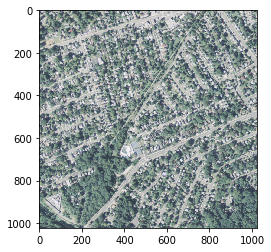

In [132]:
print(naip[:3,:,:].shape)
print(naip[:3,:,:].shape[-1])
#plt.imshow( np.rollaxis(np.squeeze(naip[:3,:,:]),0,3)/255)
print(np.rollaxis(np.squeeze(trIMtorch.cpu().numpy()[:,:3,:128,:128]),0,3).shape)

plt.imshow( np.rollaxis(np.squeeze(trIMtorch.cpu().numpy()[:,:3,1:1024,1:1024]),0,3))

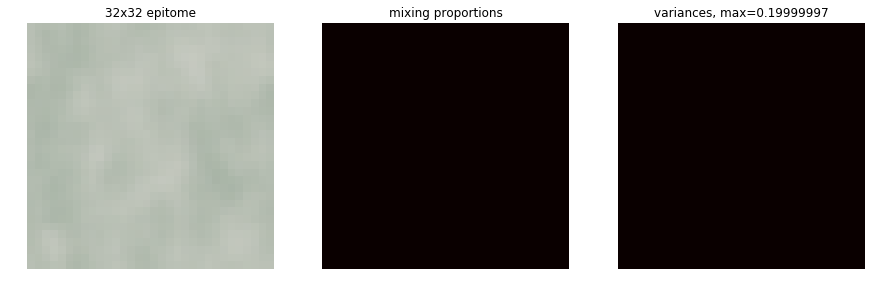

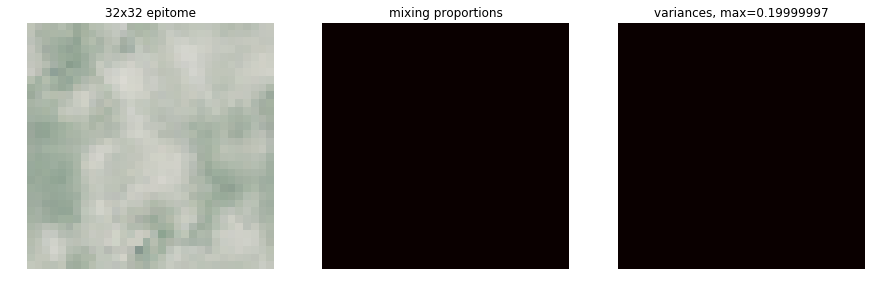

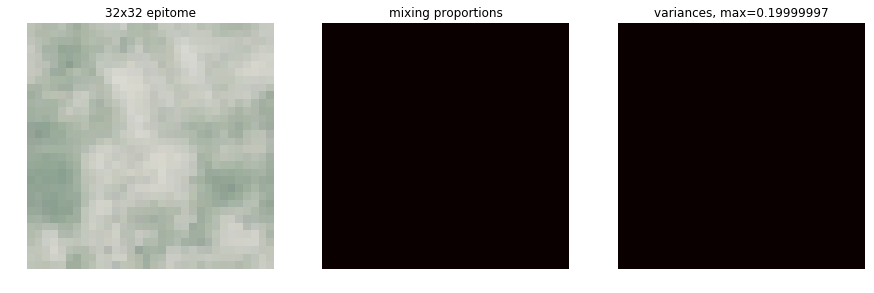

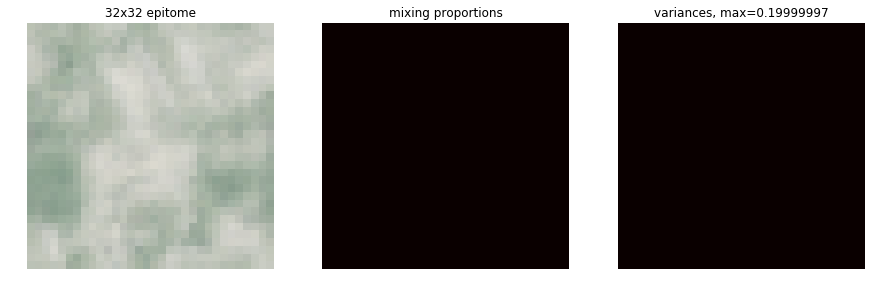

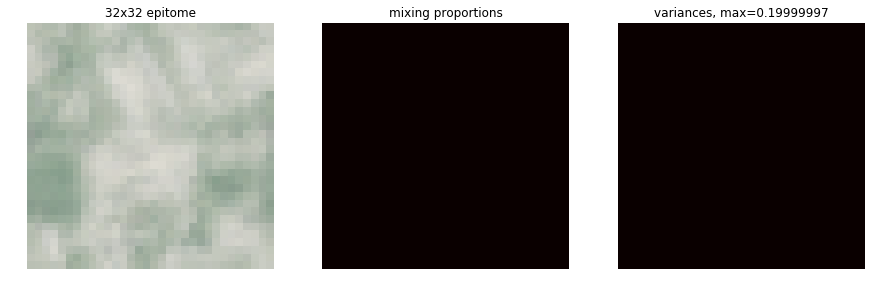

...

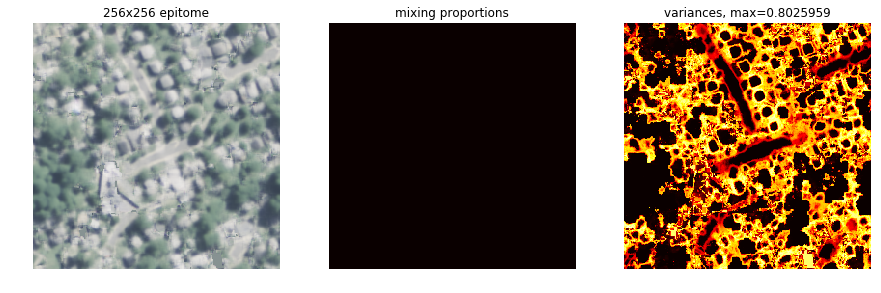

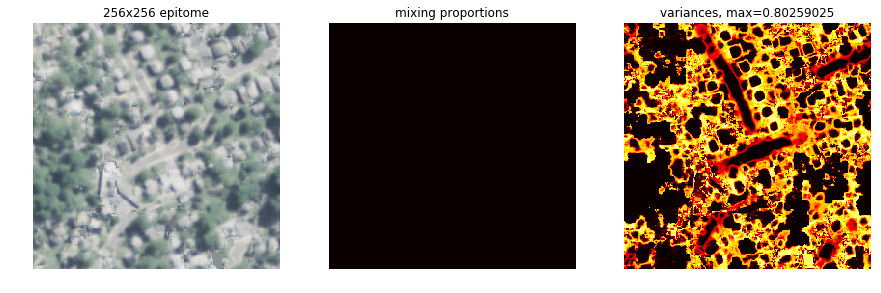

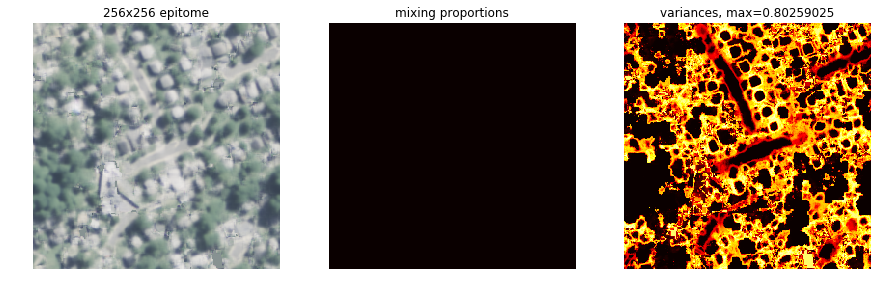

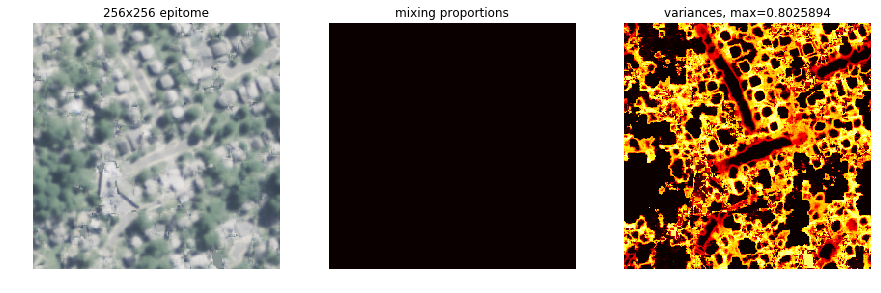

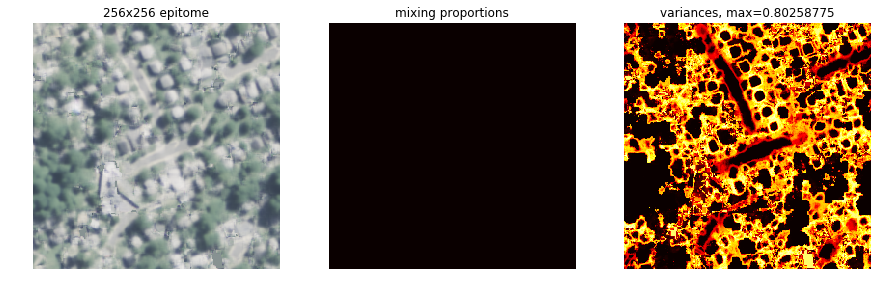

CPU times: user 5h 16min 50s, sys: 1h 2min 43s, total: 6h 19min 34s
Wall time: 5h 27min 48s


In [134]:
%%time
e, ev, p, etr = epitome_small(trIMtorch,9,256,50000,20,[ 0.125, 0.25, 0.5, 1]) #scale could be [.125 .25 .5 .75]
#cProfile.run('epitome_small(trIMtorch,8,128,3000,20,[.5])')
torch.cuda.empty_cache()

In [6]:
#Replaces the epitome (e,ev) of an image by another epitome image (emod)
#keeping the mapping intact. The routine can be used to edit images or to
#preprocess by coloring the image accoring to the image (see the segmentation
#part of the web page for more info). K specifies the patch size to use in 
#mapping inference and SPC defines the patch spacing.

def reconstruct(x,K,e,ev,emod,SPC):
    _,NoCh1,Ny,Nx = x.shape
    NoCh2 = emod.shape[0]
    if NoCh1 == 1:
        temp = x
        x = torch.stack((temp,temp,temp),dim=0)
        #x = torch.zeros((NoCh1,Nx,Ny))
        #x[:,:,0] = temp
        #x[:,:,1] = temp
        #x[:,:,2] = temp
    
    NoCh1,N,Ny = e.shape
    onemat = np.ones((K,K))
    SY = x.shape[2]
    SX = x.shape[3]
    
    ewrap = torch.zeros((NoCh1,N+K-1,N+K-1)).to(device)
    evwrap = torch.zeros((NoCh1,N+K-1,N+K-1)).to(device)
    MINP = 1e-6
    MINV = 1e-2
    
    ewrap[:,:N,:N] = e
    ewrap[:,N:,:] = ewrap[:,:K-1,:]
    ewrap[:,:,N:] = ewrap[:,:,:K-1]
    evwrap[:,:N,:N] = ev
    evwrap[:,N:,:] = evwrap[:,:K-1,:]
    evwrap[:,:,N:] = evwrap[:,:,:K-1]
    logevwrap = torch.log(evwrap)
    evwrapi = 1./evwrap
    tmp3 = torch.sum(torch.squeeze(cum_sum(torch.unsqueeze(ewrap**2*evwrapi,0),K)),dim=0)
    tmp4 = torch.sum(torch.squeeze(cum_sum(torch.unsqueeze(logevwrap,0),K)),dim=0)
    
    #tmp3 = torch.zeros((NoCh1,N,N))
    #tmp4 = torch.zeros((NoCh1,N,N))
    #for i in range(NoCh1):
        #tmp3[i,:,:] = fftconvolve(evwrap[:,:,i]**2*evwrapi[:,:,i],onemat,mode='valid')
        #tmp4[i,:,:] = fftconvolve(logevwrap[:,:,i],onemat,mode='valid')
        
    emodwrap = np.zeros((NoCh2,N+K-1,N+K-1))
    emodwrap[:,:N,:N] = emod
    emodwrap[:,N:,:] = emodwrap[:,:K-1,:]
    emodwrap[:,:,N:] = emodwrap[:,:,:K-1]
    
    z = np.zeros((NoCh2,SY,SX))
    cnt = np.zeros((SY,SX))
    ixt = 0
    iyt = 0
    for iy in range(0,SY-K+1,SPC):
        for ix in range(0,SX-K+1,SPC):
            #watch for indexing errors
            #yc = x[iy:iy+K-1,ix:ix+K-1,:]
            #print(x.shape)
            yc = x[:,:,iy:iy+K,ix:ix+K]
            #print(x.shape,yc.shape)
            #yct = torch.flip(yc,[2,3])
            #yct = yc[::-1,::-1]
            yct = yc.to(device)
            #print(yc.shape)
            lP = torch.zeros(tmp4.shape).to(device)#[:,:] = 0
            #print(evwrapi.shape,ewrap.shape,evwrap.shape,yct.shape)
            tmp1 = torch.squeeze(F.conv2d(torch.unsqueeze(evwrapi,0),yct**2))
            tmp2 = torch.squeeze(F.conv2d(torch.unsqueeze(ewrap*evwrap,0),yct))
            lP += -.5*(tmp4+tmp1-2*tmp2+tmp3)
            #for i in range(NoCh1):
                #tmp1 = fftconvolve(evwrapi[:,:,i],yct[:,:,i]**2,mode='valid')
                #tmp2 = fftconvolve(ewrap[:,:,i]*evwrap[:,:,i],yct[:,:,i],mode='valid')
                #lP += -.5*(tmp4[:,:,i]+tmp1-2*tmp2+tmp3[:,:,i])
            mxlP = torch.max(lP)
            P = torch.exp(lP-mxlP)+MINP
            nrmP = torch.sum(P)
            P /= nrmP
            mxp,mxpj = torch.max(P,dim=1)#,torch.argmax(P,dim=1)
            mxp, mxpi = torch.max(mxp),torch.argmax(mxp)
            mxpj = mxpj[mxpi]
            #watch for indexing errors
            newp = emodwrap[:,mxpi:mxpi+K-1,mxpj:mxpj+K-1]
            oldp = ewrap[:,mxpi:mxpi+K-1,mxpj:mxpj+K-1]
            z[:,iy:iy+K-1,ix:ix+K-1] += newp 
            cnt[iy:iy+K-1,ix:ix+K-1] += 1
            
            ixt = ix
            iyt = iy
    z = z[:,:iyt+K-1,:ixt+K-1]
    cnt = cnt[:iyt+K-1,:ixt+K-1]
    for i in range(NoCh2):
        z[i,:,:] /= cnt
    
    return z

In [ ]:
%%time
z = reconstruct(tsIMtorch[:,:4,:,:],17,e[0,:4,:,:],ev[0,:4,:,:],e[0,4:10,:,:],3)

In [ ]:
z.shape

In [ ]:
l
l
l
l
l